# NeuroGS Checkpoint Analysis

This notebook loads and analyzes the NeuroGS model checkpoints to understand:
1. **Model Evolution**: How the Gaussian mixture evolves during training
2. **Parameter Statistics**: Distribution of means, scales, rotations, and amplitudes
3. **Compression Metrics**: How the model size changes over iterations
4. **Visualization**: 3D and 2D projections of the learned Gaussians

---

## 1. Setup and Imports

In [2]:
import os
import glob
import numpy as np
import torch
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# Set style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {DEVICE}")

# Checkpoint directory
CKPT_DIR = "./checkpoints"
print(f"Checkpoint directory: {CKPT_DIR}")
print(f"Available checkpoints: {len(glob.glob(os.path.join(CKPT_DIR, '*.pt')))} files")

Device: cuda
Checkpoint directory: ./checkpoints
Available checkpoints: 31 files


## 2. Load All Checkpoints

Load checkpoints at different training iterations to analyze model evolution.

In [17]:
def load_checkpoint(path):
    """Load a NeuroGS checkpoint and return its contents."""
    ckpt = torch.load(path, map_location='cpu', weights_only=False)
    return ckpt

def get_checkpoint_files():
    """Get sorted list of checkpoint files by iteration number."""
    files = glob.glob(os.path.join(CKPT_DIR, "neurogs_ckpt_iter*.pt"))
    # Sort by iteration number
    def get_iter(f):
        name = os.path.basename(f)
        # Extract number from neurogs_ckpt_iter{N}.pt
        return int(name.replace("neurogs_ckpt_iter", "").replace(".pt", ""))
    return sorted(files, key=get_iter)

# Load all checkpoints
ckpt_files = get_checkpoint_files()
print(f"Found {len(ckpt_files)} training checkpoints:")
for f in ckpt_files[:5]:
    print(f"  - {os.path.basename(f)}")
print(f"  ...")
for f in ckpt_files[-3:]:
    print(f"  - {os.path.basename(f)}")

# Load final checkpoint for detailed analysis
final_ckpt_path = os.path.join(CKPT_DIR, "neurogs_codec_ckpt_final.pt")
if os.path.exists(final_ckpt_path):
    final_ckpt = load_checkpoint(final_ckpt_path)
    print(f"\n✓ Loaded final checkpoint: {final_ckpt_path}")
else:
    final_ckpt = load_checkpoint(ckpt_files[-1])
    print(f"\n✓ Loaded last checkpoint: {ckpt_files[-1]}")
print(final_ckpt['config'].keys())

Found 30 training checkpoints:
  - neurogs_ckpt_iter1000.pt
  - neurogs_ckpt_iter2000.pt
  - neurogs_ckpt_iter3000.pt
  - neurogs_ckpt_iter4000.pt
  - neurogs_ckpt_iter5000.pt
  ...
  - neurogs_ckpt_iter28000.pt
  - neurogs_ckpt_iter29000.pt
  - neurogs_ckpt_iter30000.pt

✓ Loaded final checkpoint: ./checkpoints/neurogs_codec_ckpt_final.pt
dict_keys(['N0', 'steps', 'batch', 'kappa', 'lam', 'alpha', 'beta_sparse', 'beta_smooth', 'beta_tv', 'beta_ssim', 'beta_edge', 'beta_overlap', 'beta_grad', 'lr', 'lr_final', 'densify_enabled', 'densify_from_iter', 'densify_until_iter', 'densify_every', 'max_gaussians', 'min_amplitude', 'grad_threshold', 'topo_patch', 'save_every'])


## 3. Checkpoint Structure Analysis

Examine what parameters are stored in each checkpoint.

In [18]:
print("=" * 60)
print("CHECKPOINT STRUCTURE")
print("=" * 60)

for key, value in final_ckpt.items():
    if isinstance(value, torch.Tensor):
        print(f"  {key:20s} | Tensor {str(value.shape):20s} | dtype: {value.dtype}")
    elif isinstance(value, (int, float)):
        print(f"  {key:20s} | Scalar: {value}")
    elif isinstance(value, dict):
        print(f"  {key:20s} | Dict with {len(value)} keys")
    else:
        print(f"  {key:20s} | {type(value).__name__}")

print("=" * 60)

CHECKPOINT STRUCTURE
  model_state          | Dict with 5 keys
  model_N              | Scalar: 169295
  entropy_state        | Dict with 5 keys
  Q                    | Dict with 5 keys
  config               | Dict with 24 keys
  iteration            | Scalar: 30000
  losses               | Dict with 12 keys
  densify_log          | list
  tif_path             | str
  voxel_spacing        | tuple
  saved_at             | str


## 4. Gaussian Count Evolution

Track how the number of Gaussians changes during training (densification/pruning).

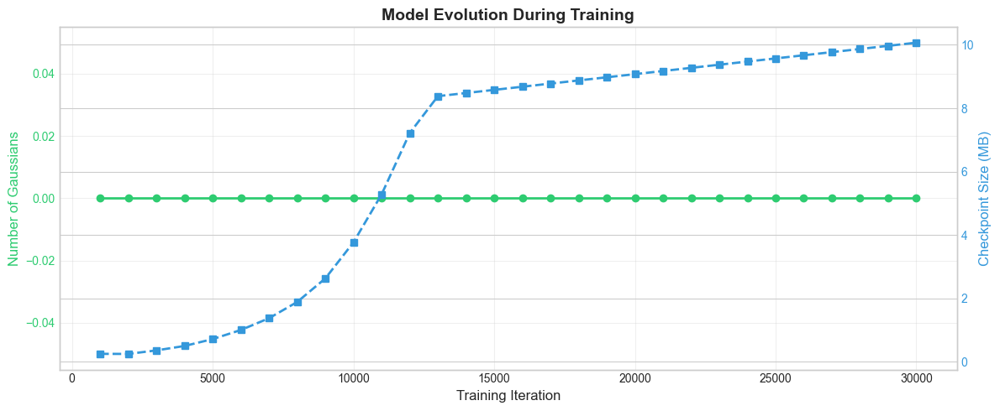


Summary:
  Initial Gaussians:  0
  Final Gaussians:    0
  Growth factor:      N/A (initial count is 0)
  Final model size:   10.07 MB


In [5]:
iterations = []
n_gaussians = []
file_sizes = []

for ckpt_path in ckpt_files:
    ckpt = load_checkpoint(ckpt_path)
    
    # Extract iteration from filename
    name = os.path.basename(ckpt_path)
    iter_num = int(name.replace("neurogs_ckpt_iter", "").replace(".pt", ""))
    iterations.append(iter_num)
    
    # Count Gaussians (from means tensor)
    if 'means' in ckpt:
        n_gaussians.append(ckpt['means'].shape[0])
    elif 'mu' in ckpt:
        n_gaussians.append(ckpt['mu'].shape[0])
    else:
        n_gaussians.append(0)
    
    # File size in MB
    file_sizes.append(os.path.getsize(ckpt_path) / (1024 * 1024))

# Create figure with dual y-axis
fig, ax1 = plt.subplots(figsize=(12, 5))

color1 = '#2ecc71'
ax1.set_xlabel('Training Iteration', fontsize=12)
ax1.set_ylabel('Number of Gaussians', color=color1, fontsize=12)
ax1.plot(iterations, n_gaussians, 'o-', color=color1, linewidth=2, markersize=6, label='Gaussians')
ax1.tick_params(axis='y', labelcolor=color1)
ax1.grid(True, alpha=0.3)

ax2 = ax1.twinx()
color2 = '#3498db'
ax2.set_ylabel('Checkpoint Size (MB)', color=color2, fontsize=12)
ax2.plot(iterations, file_sizes, 's--', color=color2, linewidth=2, markersize=6, label='File Size')
ax2.tick_params(axis='y', labelcolor=color2)

plt.title('Model Evolution During Training', fontsize=14, fontweight='bold')
fig.tight_layout()
plt.show()

print(f"\nSummary:")
print(f"  Initial Gaussians:  {n_gaussians[0]:,}")
print(f"  Final Gaussians:    {n_gaussians[-1]:,}")
if n_gaussians[0] > 0:
    growth_factor = n_gaussians[-1] / n_gaussians[0]
    print(f"  Growth factor:      {growth_factor:.2f}x")
else:
    print("  Growth factor:      N/A (initial count is 0)")
print(f"  Final model size:   {file_sizes[-1]:.2f} MB")

## 5. Parameter Distribution Analysis

Analyze the statistical distribution of learned Gaussian parameters.

In [6]:
# Extract parameters from final checkpoint
ckpt_data = final_ckpt.get('model_state', final_ckpt)

if 'means' in ckpt_data:
    means = ckpt_data['means'].numpy()
    log_scales = ckpt_data['log_scales'].numpy()
    quats = ckpt_data['quats'].numpy()
    amps = ckpt_data['amps'].numpy()
    bias = ckpt_data['bias'].item() if 'bias' in ckpt_data else 0.0
elif 'mu' in ckpt_data:
    means = ckpt_data['mu'].numpy()
    log_scales = ckpt_data['log_s'].numpy()
    quats = ckpt_data['q'].numpy()
    amps = ckpt_data['a'].numpy()
    bias = ckpt_data['b'].item() if 'b' in ckpt_data else 0.0
else:
    raise KeyError("Unknown checkpoint format")

scales = np.exp(log_scales)
N = means.shape[0]

print(f"Number of Gaussians: {N:,}")
print(f"Global bias: {bias:.4f}")

Number of Gaussians: 169,295
Global bias: 0.0005


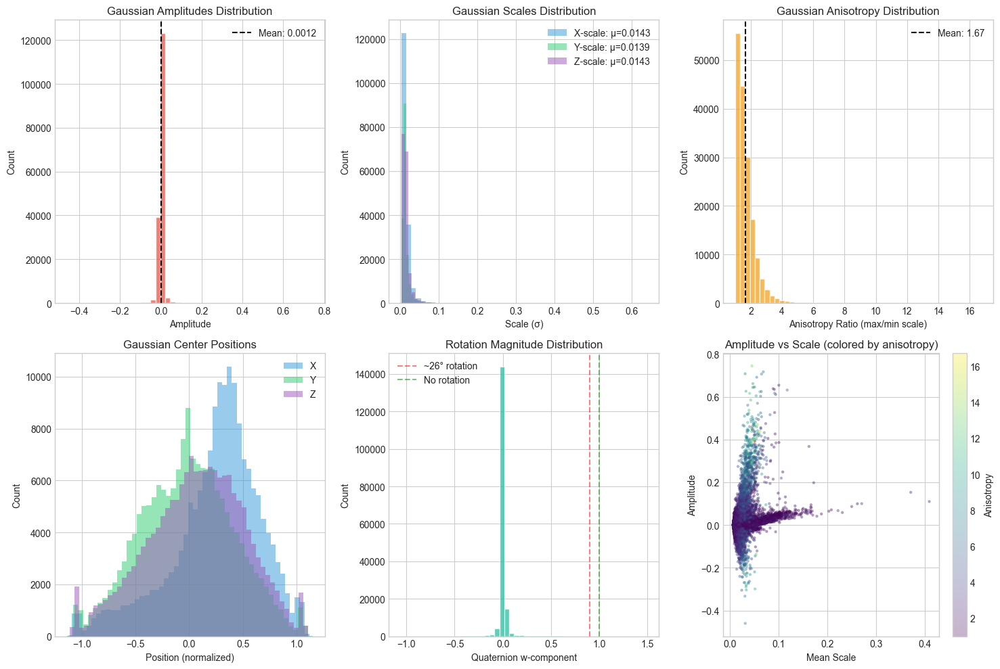

In [7]:
# Create comprehensive parameter distribution plots
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 1. Amplitude distribution
ax = axes[0, 0]
ax.hist(amps, bins=50, color='#e74c3c', alpha=0.7, edgecolor='white')
ax.axvline(amps.mean(), color='black', linestyle='--', label=f'Mean: {amps.mean():.4f}')
ax.set_xlabel('Amplitude')
ax.set_ylabel('Count')
ax.set_title('Gaussian Amplitudes Distribution')
ax.legend()

# 2. Scale distribution (all 3 axes)
ax = axes[0, 1]
colors = ['#3498db', '#2ecc71', '#9b59b6']
labels = ['X-scale', 'Y-scale', 'Z-scale']
for i, (c, l) in enumerate(zip(colors, labels)):
    ax.hist(scales[:, i], bins=50, alpha=0.5, color=c, label=f'{l}: μ={scales[:, i].mean():.4f}')
ax.set_xlabel('Scale (σ)')
ax.set_ylabel('Count')
ax.set_title('Gaussian Scales Distribution')
ax.legend()

# 3. Anisotropy ratio (max_scale / min_scale)
ax = axes[0, 2]
anisotropy = scales.max(axis=1) / (scales.min(axis=1) + 1e-8)
ax.hist(anisotropy, bins=50, color='#f39c12', alpha=0.7, edgecolor='white')
ax.axvline(anisotropy.mean(), color='black', linestyle='--', label=f'Mean: {anisotropy.mean():.2f}')
ax.set_xlabel('Anisotropy Ratio (max/min scale)')
ax.set_ylabel('Count')
ax.set_title('Gaussian Anisotropy Distribution')
ax.legend()

# 4. Spatial distribution (histogram of positions)
ax = axes[1, 0]
for i, (c, l) in enumerate(zip(colors, ['X', 'Y', 'Z'])):
    ax.hist(means[:, i], bins=50, alpha=0.5, color=c, label=l)
ax.set_xlabel('Position (normalized)')
ax.set_ylabel('Count')
ax.set_title('Gaussian Center Positions')
ax.legend()

# 5. Quaternion w-component (rotation amount)
ax = axes[1, 1]
quat_w = quats[:, 0]  # w component (1 = no rotation)
ax.hist(quat_w, bins=50, color='#1abc9c', alpha=0.7, edgecolor='white')
ax.axvline(0.9, color='red', linestyle='--', alpha=0.5, label='~26° rotation')
ax.axvline(1.0, color='green', linestyle='--', alpha=0.5, label='No rotation')
ax.set_xlabel('Quaternion w-component')
ax.set_ylabel('Count')
ax.set_title('Rotation Magnitude Distribution')
ax.legend()

# 6. Amplitude vs Scale scatter
ax = axes[1, 2]
mean_scale = scales.mean(axis=1)
scatter = ax.scatter(mean_scale, amps, c=anisotropy, cmap='viridis', alpha=0.3, s=5)
ax.set_xlabel('Mean Scale')
ax.set_ylabel('Amplitude')
ax.set_title('Amplitude vs Scale (colored by anisotropy)')
plt.colorbar(scatter, ax=ax, label='Anisotropy')

plt.tight_layout()
plt.show()

## 6. Spatial Visualization of Gaussians

Visualize the 3D distribution of Gaussian centers.

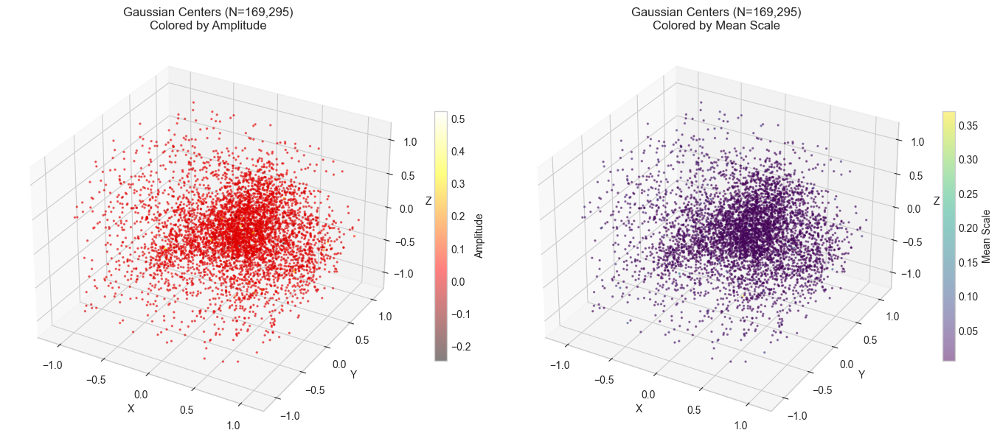

In [8]:
# 3D scatter plot of Gaussian centers (subsample for visualization)
max_points = 5000
if N > max_points:
    idx = np.random.choice(N, max_points, replace=False)
else:
    idx = np.arange(N)

fig = plt.figure(figsize=(14, 6))

# Left: 3D view colored by amplitude
ax1 = fig.add_subplot(121, projection='3d')
sc = ax1.scatter(means[idx, 0], means[idx, 1], means[idx, 2], 
                  c=amps[idx], cmap='hot', s=2, alpha=0.5)
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z')
ax1.set_title(f'Gaussian Centers (N={N:,})\nColored by Amplitude')
plt.colorbar(sc, ax=ax1, label='Amplitude', shrink=0.6)

# Right: 3D view colored by mean scale
ax2 = fig.add_subplot(122, projection='3d')
sc2 = ax2.scatter(means[idx, 0], means[idx, 1], means[idx, 2], 
                   c=scales[idx].mean(axis=1), cmap='viridis', s=2, alpha=0.5)
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_zlabel('Z')
ax2.set_title(f'Gaussian Centers (N={N:,})\nColored by Mean Scale')
plt.colorbar(sc2, ax=ax2, label='Mean Scale', shrink=0.6)

plt.tight_layout()
plt.show()

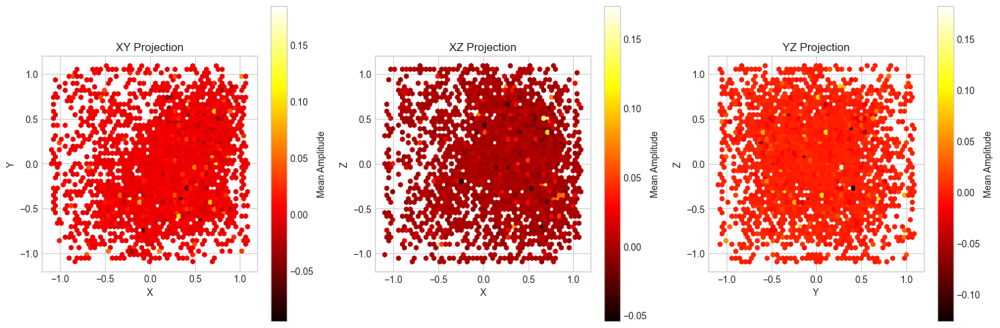

In [9]:
# 2D projections (XY, XZ, YZ planes)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

projections = [
    (0, 1, 'XY Projection'),
    (0, 2, 'XZ Projection'),
    (1, 2, 'YZ Projection')
]

for ax, (i, j, title) in zip(axes, projections):
    hb = ax.hexbin(means[idx, i], means[idx, j], C=amps[idx], 
                   gridsize=50, cmap='hot', reduce_C_function=np.mean)
    ax.set_xlabel(['X', 'Y', 'Z'][i])
    ax.set_ylabel(['X', 'Y', 'Z'][j])
    ax.set_title(title)
    ax.set_aspect('equal')
    plt.colorbar(hb, ax=ax, label='Mean Amplitude')

plt.tight_layout()
plt.show()

## 7. Training Progression Analysis

Compare parameter distributions across training iterations.

In [11]:
# Select checkpoints at different stages
stages = [0, len(ckpt_files)//4, len(ckpt_files)//2, 3*len(ckpt_files)//4, -1]
stage_names = ['Early', '25%', '50%', '75%', 'Final']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

amp_data = []
scale_data = []
aniso_data = []
labels = []

for idx, name in zip(stages, stage_names):
    ckpt = load_checkpoint(ckpt_files[idx])
    ckpt_data = ckpt.get('model_state', ckpt)
    
    if 'means' in ckpt_data:
        a = ckpt_data['amps'].numpy()
        s = np.exp(ckpt_data['log_scales'].numpy())
    elif 'a' in ckpt_data:
        a = ckpt_data['a'].numpy()
        s = np.exp(ckpt_data['log_s'].numpy())
    else:
        raise KeyError("Unknown checkpoint format: missing amplitude/scale keys")
    
    iter_num = int(os.path.basename(ckpt_files[idx]).replace("neurogs_ckpt_iter", "").replace(".pt", ""))
    labels.append(f'{name}\n(iter {iter_num})')
    
    amp_data.append(a)
    scale_data.append(s.mean(axis=1))
    aniso_data.append(s.max(axis=1) / (s.min(axis=1) + 1e-8))

# Amplitude evolution
ax = axes[0, 0]
ax.boxplot(amp_data, labels=labels)
ax.set_ylabel('Amplitude')
ax.set_title('Amplitude Distribution Evolution')
ax.grid(True, alpha=0.3)

# Scale evolution  
ax = axes[0, 1]
ax.boxplot(scale_data, labels=labels)
ax.set_ylabel('Mean Scale')
ax.set_title('Scale Distribution Evolution')
ax.grid(True, alpha=0.3)

# Anisotropy evolution
ax = axes[1, 0]
ax.boxplot(aniso_data, labels=labels)
ax.set_ylabel('Anisotropy Ratio')
ax.set_title('Anisotropy Distribution Evolution')
ax.grid(True, alpha=0.3)

# Number of Gaussians evolution
ax = axes[1, 1]
selected_iters = [iterations[i] for i in stages]
selected_counts = [n_gaussians[i] for i in stages]
ax.bar(range(len(stages)), selected_counts, color='#3498db', alpha=0.7)
ax.set_xticks(range(len(stages)))
ax.set_xticklabels(labels)
ax.set_ylabel('Number of Gaussians')
ax.set_title('Gaussian Count Evolution')
ax.grid(True, alpha=0.3, axis='y')

for i, v in enumerate(selected_counts):
    ax.text(i, v + 500, f'{v:,}', ha='center', fontsize=9)

plt.tight_layout()
plt.savefig('neurogs_training_evolution.png', dpi=300)
plt.show()

/tmp/ipykernel_312520/140318527.py:34: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(amp_data, labels=labels)
/tmp/ipykernel_312520/140318527.py:41: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(scale_data, labels=labels)
/tmp/ipykernel_312520/140318527.py:48: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(aniso_data, labels=labels)
/tmp/ipykernel_312520/140318527.py:67: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


## 8. Memory and Compression Analysis

Analyze the storage requirements and compression efficiency.

In [19]:
# Calculate theoretical storage requirements
def calculate_storage(ckpt):
    """Calculate storage in bytes for each parameter type."""
    storage = {}
    
    if 'means' in ckpt:
        storage['means'] = ckpt['means'].numel() * 4  # float32
        storage['log_scales'] = ckpt['log_scales'].numel() * 4
        storage['quats'] = ckpt['quats'].numel() * 4
        storage['amps'] = ckpt['amps'].numel() * 4
        storage['bias'] = 4
    else:
        storage['means'] = ckpt['mu'].numel() * 4
        storage['log_scales'] = ckpt['log_s'].numel() * 4
        storage['quats'] = ckpt['q'].numel() * 4
        storage['amps'] = ckpt['a'].numel() * 4
        storage['bias'] = 4
    
    return storage
print(ckpt_data.keys())
storage = calculate_storage(final_ckpt['model_state'])
total_bytes = sum(storage.values())

print("=" * 60)
print("STORAGE BREAKDOWN (Final Model)")
print("=" * 60)

for param, bytes_val in storage.items():
    pct = bytes_val / total_bytes * 100
    print(f"  {param:15s}: {bytes_val/1024:8.2f} KB  ({pct:5.1f}%)")

print("-" * 60)
print(f"  {'TOTAL':15s}: {total_bytes/1024:8.2f} KB")
print(f"  {'':15s}  {total_bytes/(1024*1024):8.2f} MB")
print("=" * 60)

# Per-Gaussian storage
bytes_per_gaussian = total_bytes / N
print(f"\nStorage per Gaussian: {bytes_per_gaussian:.1f} bytes")
print(f"  - means:      12 bytes (3 x float32)")
print(f"  - log_scales: 12 bytes (3 x float32)")
print(f"  - quaternion: 16 bytes (4 x float32)")
print(f"  - amplitude:   4 bytes (1 x float32)")
print(f"  - Total:      44 bytes per Gaussian")

odict_keys(['mu', 'log_s', 'q', 'a', 'b'])
STORAGE BREAKDOWN (Final Model)
  means          :  1983.93 KB  ( 27.3%)
  log_scales     :  1983.93 KB  ( 27.3%)
  quats          :  2645.23 KB  ( 36.4%)
  amps           :   661.31 KB  (  9.1%)
  bias           :     0.00 KB  (  0.0%)
------------------------------------------------------------
  TOTAL          :  7274.40 KB
                       7.10 MB

Storage per Gaussian: 44.0 bytes
  - means:      12 bytes (3 x float32)
  - log_scales: 12 bytes (3 x float32)
  - quaternion: 16 bytes (4 x float32)
  - amplitude:   4 bytes (1 x float32)
  - Total:      44 bytes per Gaussian


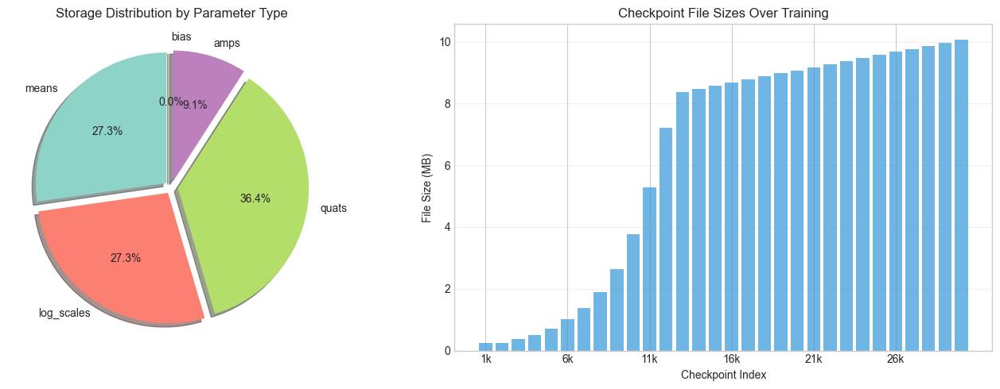

In [20]:
# Visualize storage breakdown
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Pie chart
ax = axes[0]
labels = list(storage.keys())
sizes = list(storage.values())
colors = plt.cm.Set3(np.linspace(0, 1, len(labels)))
explode = [0.05] * len(labels)

ax.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
       shadow=True, startangle=90)
ax.set_title('Storage Distribution by Parameter Type')

# Bar chart: File size vs iteration
ax = axes[1]
ax.bar(range(len(iterations)), file_sizes, color='#3498db', alpha=0.7, width=0.8)
ax.set_xlabel('Checkpoint Index')
ax.set_ylabel('File Size (MB)')
ax.set_title('Checkpoint File Sizes Over Training')
ax.set_xticks(range(0, len(iterations), 5))
ax.set_xticklabels([f'{iterations[i]//1000}k' for i in range(0, len(iterations), 5)])
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

## 9. Summary Statistics

Generate a comprehensive summary of the final trained model.

In [23]:
print("=" * 70)
print("NEUROGS MODEL SUMMARY")
print("=" * 70)

print(f"\n📊 MODEL ARCHITECTURE")
print(f"   Number of Gaussians:     {N:,}")
print(f"   Parameters per Gaussian: 44 bytes (means + scales + rotation + amplitude)")
print(f"   Total Parameters:        {N * 11:,} (floats)")
print(f"   Global Bias:             {bias:.6f}")

print(f"\n📍 SPATIAL DISTRIBUTION")
print(f"   X range: [{means[:, 0].min():.4f}, {means[:, 0].max():.4f}]")
print(f"   Y range: [{means[:, 1].min():.4f}, {means[:, 1].max():.4f}]")
print(f"   Z range: [{means[:, 2].min():.4f}, {means[:, 2].max():.4f}]")

print(f"\n📏 SCALE STATISTICS")
print(f"   Mean scale (X, Y, Z):    ({scales[:, 0].mean():.4f}, {scales[:, 1].mean():.4f}, {scales[:, 2].mean():.4f})")
print(f"   Scale std  (X, Y, Z):    ({scales[:, 0].std():.4f}, {scales[:, 1].std():.4f}, {scales[:, 2].std():.4f})")
print(f"   Mean anisotropy ratio:   {anisotropy.mean():.2f}x")
print(f"   Max anisotropy ratio:    {anisotropy.max():.2f}x")

print(f"\n🎯 AMPLITUDE STATISTICS")
print(f"   Mean amplitude:          {amps.mean():.6f}")
print(f"   Std amplitude:           {amps.std():.6f}")
print(f"   Min amplitude:           {amps.min():.6f}")
print(f"   Max amplitude:           {amps.max():.6f}")

print(f"\n🔄 ROTATION STATISTICS")
rotation_angles = 2 * np.arccos(np.clip(np.abs(quats[:, 0]), 0, 1)) * 180 / np.pi
print(f"   Mean rotation angle:     {rotation_angles.mean():.2f}°")
print(f"   Max rotation angle:      {rotation_angles.max():.2f}°")

print(f"\n💾 STORAGE")
print(f"   Model size:              {total_bytes / (1024*1024):.2f} MB")
print(f"   Bytes per Gaussian:      {bytes_per_gaussian:.1f}")

print(f"\n📈 TRAINING")
print(f"   Final iteration:         {iterations[-1]:,}")
# print(f"   Gaussian growth:         {n_gaussians[0]:,} → {n_gaussians[-1]:,} ({n_gaussians[-1]/n_gaussians[0]:.1f}x)")

print("=" * 70)

NEUROGS MODEL SUMMARY

📊 MODEL ARCHITECTURE
   Number of Gaussians:     169,295
   Parameters per Gaussian: 44 bytes (means + scales + rotation + amplitude)
   Total Parameters:        1,862,245 (floats)
   Global Bias:             0.000482

📍 SPATIAL DISTRIBUTION
   X range: [-1.1389, 1.1215]
   Y range: [-1.1274, 1.1524]
   Z range: [-1.1159, 1.1106]

📏 SCALE STATISTICS
   Mean scale (X, Y, Z):    (0.0143, 0.0139, 0.0143)
   Scale std  (X, Y, Z):    (0.0101, 0.0100, 0.0101)
   Mean anisotropy ratio:   1.67x
   Max anisotropy ratio:    16.73x

🎯 AMPLITUDE STATISTICS
   Mean amplitude:          0.001222
   Std amplitude:           0.022937
   Min amplitude:           -0.460040
   Max amplitude:           0.744144

🔄 ROTATION STATISTICS
   Mean rotation angle:     178.15°
   Max rotation angle:      180.00°

💾 STORAGE
   Model size:              7.10 MB
   Bytes per Gaussian:      44.0

📈 TRAINING
   Final iteration:         30,000


## 10. Export Analysis Results

Save the analysis results for later use.

In [24]:
# Save summary statistics to a JSON file
import json

summary = {
    "model": {
        "n_gaussians": int(N),
        "total_parameters": int(N * 11),
        "model_size_mb": float(total_bytes / (1024*1024)),
        "bytes_per_gaussian": float(bytes_per_gaussian),
        "global_bias": float(bias)
    },
    "spatial": {
        "x_range": [float(means[:, 0].min()), float(means[:, 0].max())],
        "y_range": [float(means[:, 1].min()), float(means[:, 1].max())],
        "z_range": [float(means[:, 2].min()), float(means[:, 2].max())]
    },
    "scales": {
        "mean": [float(scales[:, i].mean()) for i in range(3)],
        "std": [float(scales[:, i].std()) for i in range(3)],
        "mean_anisotropy": float(anisotropy.mean()),
        "max_anisotropy": float(anisotropy.max())
    },
    "amplitudes": {
        "mean": float(amps.mean()),
        "std": float(amps.std()),
        "min": float(amps.min()),
        "max": float(amps.max())
    },
    "rotations": {
        "mean_angle_degrees": float(rotation_angles.mean()),
        "max_angle_degrees": float(rotation_angles.max())
    },
    "training": {
        "final_iteration": int(iterations[-1]),
        "initial_gaussians": int(n_gaussians[0]),
        "final_gaussians": int(n_gaussians[-1]),
        "growth_factor": float(n_gaussians[-1] / n_gaussians[0])
    }
}

output_path = "./checkpoint_analysis_summary.json"
with open(output_path, 'w') as f:
    json.dump(summary, f, indent=2)

print(f"✓ Summary saved to: {output_path}")

ZeroDivisionError: division by zero

In [29]:
# visualise the reconstructed image


---

## Conclusion

This analysis provides insights into:

1. **Model Growth**: The number of Gaussians increases significantly during training through densification, enabling finer detail capture.

2. **Anisotropic Fitting**: Gaussians learn different scales along each axis, allowing efficient representation of elongated structures like neurites.

3. **Spatial Coverage**: Gaussian centers are distributed throughout the volume, with higher density in regions of interest.

4. **Storage Efficiency**: Each Gaussian requires only 44 bytes, making the representation memory-efficient.

---
*Generated by NeuroGS Checkpoint Analysis Notebook*